In [ ]:
import tensorflow as tf
import os
import time
import numpy as np
import keras
from keras.layers import Dense, Conv2D, MaxPooling2D, UpSampling2D, Dropout, Input, LeakyReLU, InputLayer, Flatten
from keras.models import Sequential
from keras.preprocessing.image import img_to_array
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
import re
from time import time

In [ ]:
from google.colab import drive
drive.mount('/gdrive', force_remount=True)

Mounted at /gdrive


In [ ]:
!ls "/gdrive/My Drive"

In [ ]:
# Change PATH variable to absolute/ relative path to the images directory on your machine which contains the train and val folders
PATH = '/gdrive/My Drive/hconcat2' 

# Change these variables as per your need
EPOCHS = 95
BUFFER_SIZE = 4500
BATCH_SIZE = 10
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_png(image)

    w = tf.shape(image)[1]

    w = w // 2
    real_image = image[:, :w, :]
    input_image = image[:, w:, :]

    input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)

    return input_image, real_image

In [ ]:
def resize(input_image, real_image, height, width):
    input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image

def random_crop(input_image, real_image):
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

    return cropped_image[0], cropped_image[1]

def normalize(input_image, real_image):
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    return input_image, real_image

@tf.function()
def random_jitter(input_image, real_image):
    input_image, real_image = resize(input_image, real_image, 286, 286)
    input_image, real_image = random_crop(input_image, real_image)

    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image

In [ ]:
def load_image_train(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image
    
train_dataset = tf.data.Dataset.list_files(PATH+'/train/*.png')
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [ ]:
def load_image_test(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image
  
test_dataset = tf.data.Dataset.list_files(PATH+'/val/*.png')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [ ]:
OUTPUT_CHANNELS = 3

def downsample(filters, size, shape, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same', batch_input_shape=shape, 
                             kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result

def upsample(filters, size, shape, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2, batch_input_shape=shape,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

def buildGenerator():
    inputs = tf.keras.layers.Input(shape=[256,256,3])

    down_stack = [
        downsample(64, 4, (None, 256, 256, 3), apply_batchnorm=False), # (bs, 128, 128, 64)
        downsample(128, 4, (None, 128, 128, 64)), # (bs, 64, 64, 128)
        downsample(256, 4, (None, 64, 64, 128)), # (bs, 32, 32, 256)
        downsample(512, 4, (None, 32, 32, 256)), # (bs, 16, 16, 512)
        downsample(512, 4, (None, 16, 16, 512)), # (bs, 8, 8, 512)
        downsample(512, 4, (None, 8, 8, 512)), # (bs, 4, 4, 512)
        downsample(512, 4, (None, 4, 4, 512)), # (bs, 2, 2, 512)
        downsample(512, 4, (None, 2, 2, 512)), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, (None, 1, 1, 512), apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, (None, 2, 2, 1024), apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, (None, 4, 4, 1024), apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4, (None, 8, 8, 1024)), # (bs, 16, 16, 1024)
        upsample(256, 4, (None, 16, 16, 1024)), # (bs, 32, 32, 512)
        upsample(128, 4, (None, 32, 32, 512)), # (bs, 64, 64, 256)
        upsample(64, 4, (None, 64, 64, 256)), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                           strides=2,
                                           padding='same',
                                           kernel_initializer=initializer,
                                           activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

generator = buildGenerator()

In [ ]:
def downs(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same', 
                             kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result

def buildDiscriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

    down1 = downs(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downs(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downs(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)
  
discriminator = buildDiscriminator()

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

LAMBDA = 100

def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss


def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './Sketch2Color_training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

In [ ]:
import datetime
log_dir="Sketch2Coloe_logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
        tf.summary.scalar('disc_loss', disc_loss, step=epoch)

In [ ]:
def fit(train_ds, epochs, test_ds):
    for epoch in range(epochs):
        start = time()

        for example_input, example_target in test_ds.take(1):
            generate_images(generator, example_input, example_target)
        print("Epoch: ", epoch)

        for n, (input_image, target) in train_ds.enumerate():
            print('.', end='')
            if (n+1) % 100 == 0:
                print()
            train_step(input_image, target, epoch)
        print()

        if (epoch + 1) % 5 == 0:
            checkpoint.save(file_prefix = checkpoint_prefix)

        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time()-start))
    checkpoint.save(file_prefix = checkpoint_prefix)

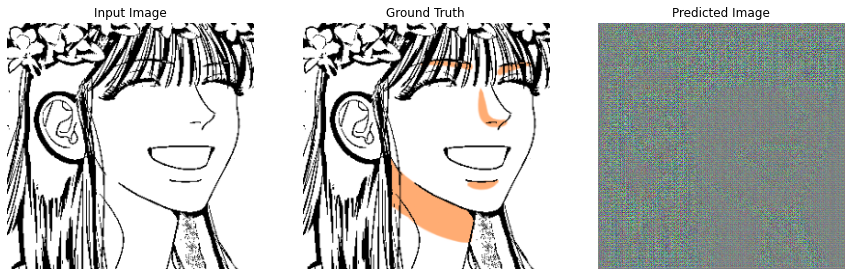

Epoch:  0
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 1 is 672.6170742511749 sec



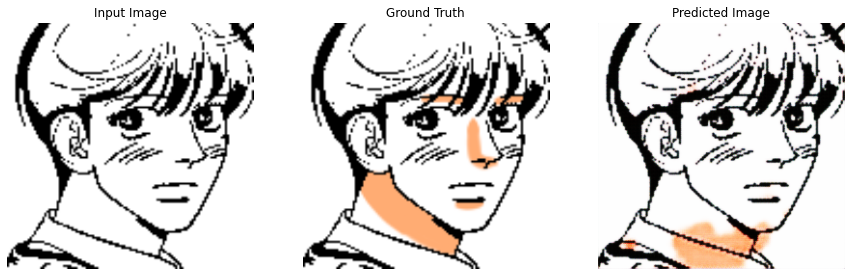

Epoch:  1
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 2 is 182.15833282470703 sec



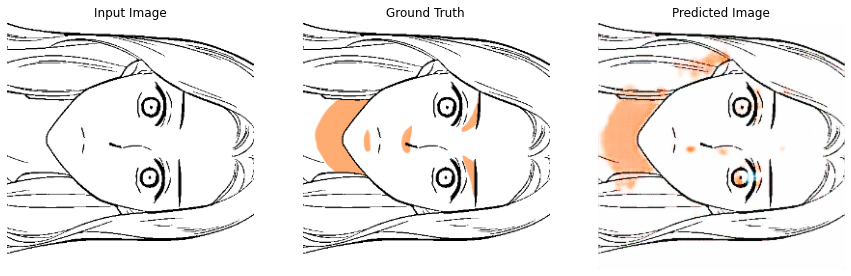

Epoch:  2
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 3 is 179.78268933296204 sec



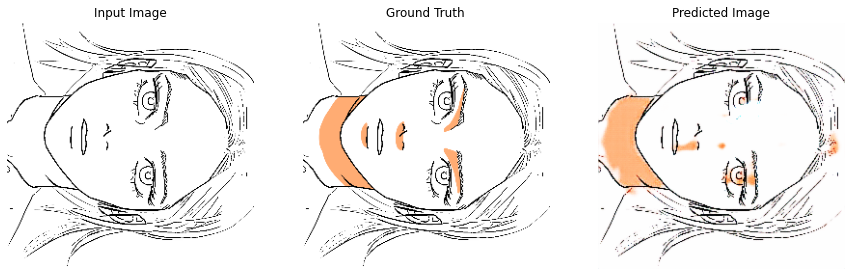

Epoch:  3
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 4 is 179.8970503807068 sec



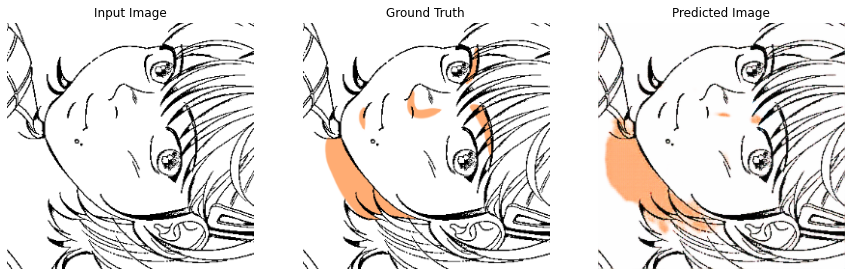

Epoch:  4
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 5 is 183.10874938964844 sec



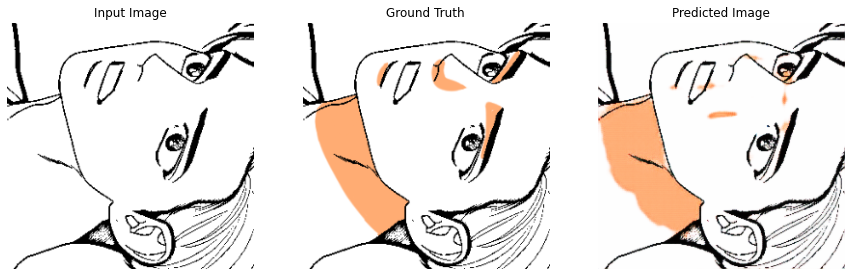

Epoch:  5
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 6 is 181.23416209220886 sec



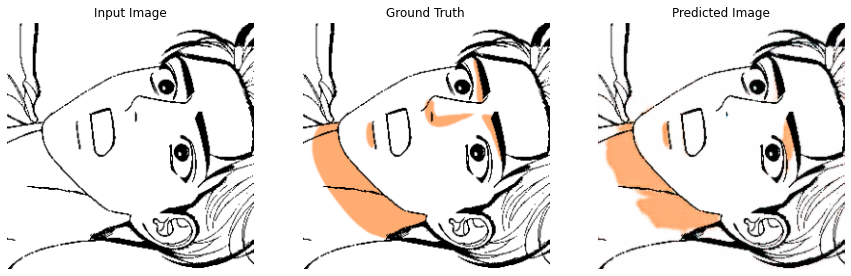

Epoch:  6
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 7 is 180.27999234199524 sec



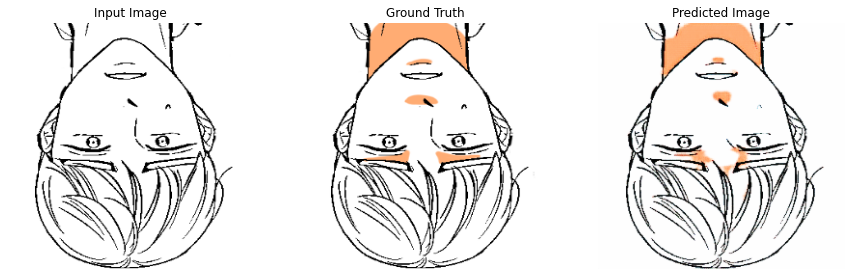

Epoch:  7
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 8 is 179.67851614952087 sec



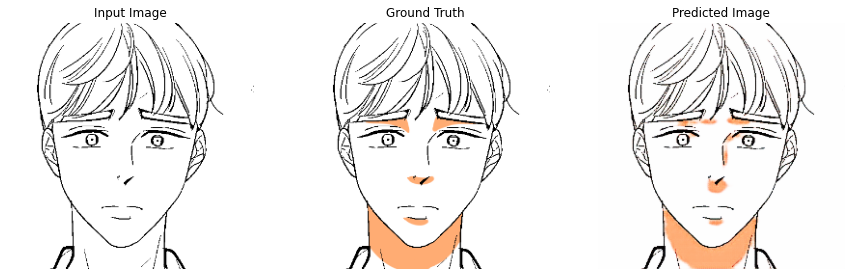

Epoch:  8
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 9 is 179.72398138046265 sec



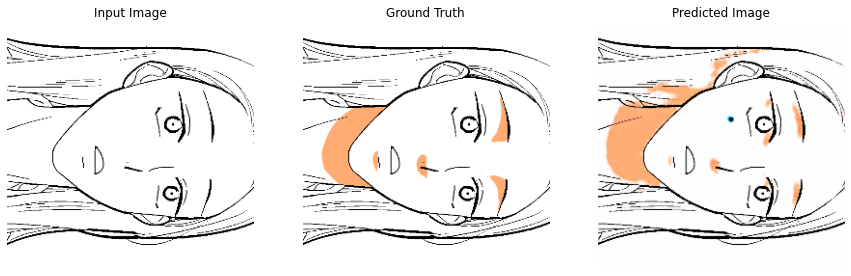

Epoch:  9
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 10 is 182.79736733436584 sec



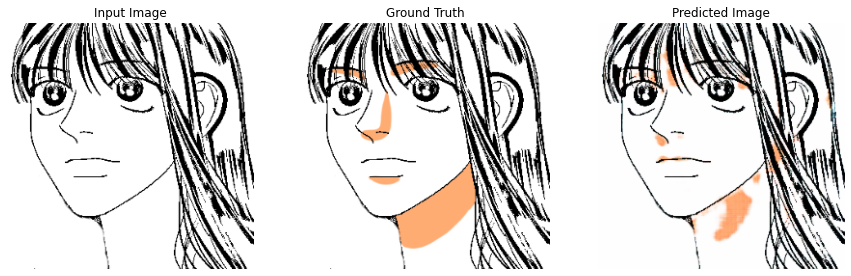

Epoch:  10
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 11 is 180.6948311328888 sec



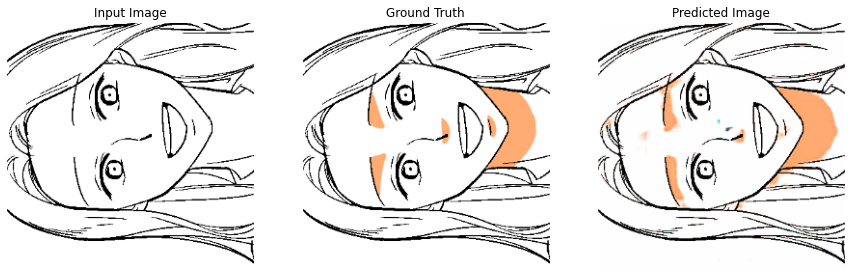

Epoch:  11
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 12 is 180.09454894065857 sec



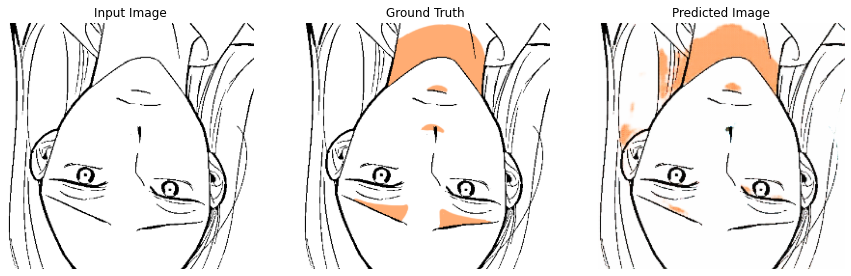

Epoch:  12
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 13 is 179.05386924743652 sec



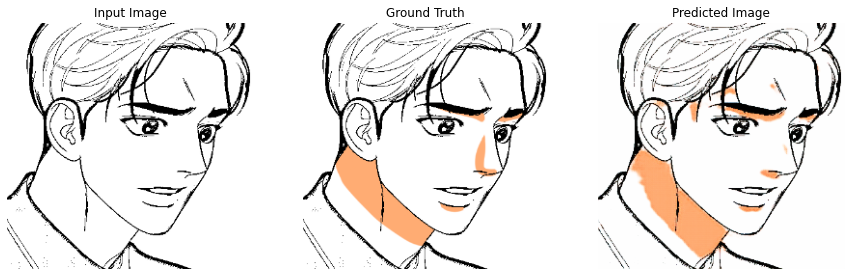

Epoch:  13
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 14 is 179.9765133857727 sec



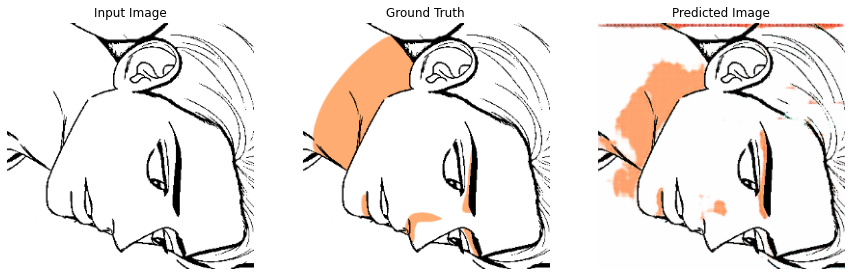

Epoch:  14
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 15 is 183.8268427848816 sec



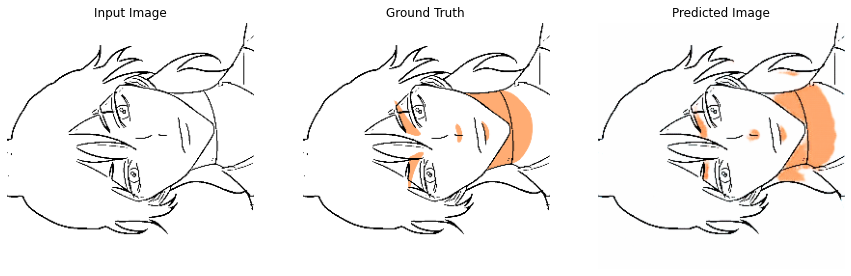

Epoch:  15
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 16 is 180.44899892807007 sec



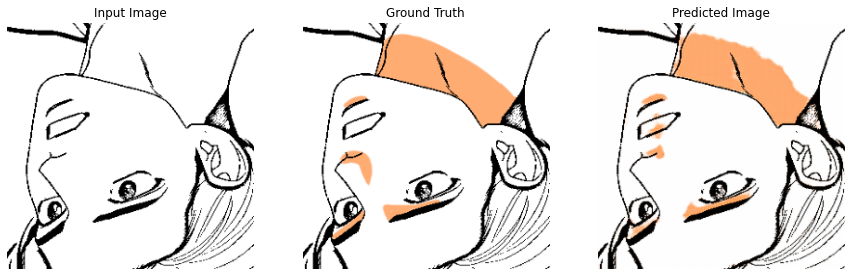

Epoch:  16
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 17 is 180.97862672805786 sec



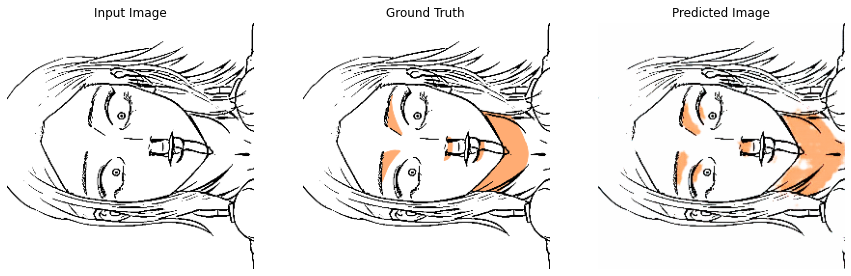

Epoch:  17
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 18 is 181.10944199562073 sec



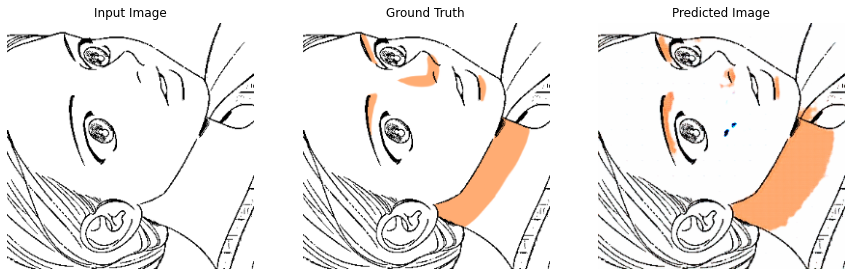

Epoch:  18
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 19 is 180.53455662727356 sec



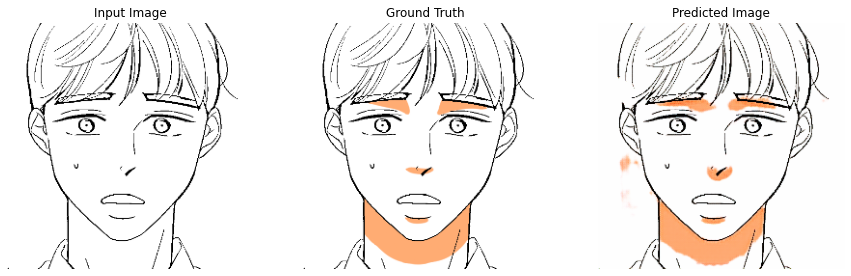

Epoch:  19
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 20 is 182.23545265197754 sec



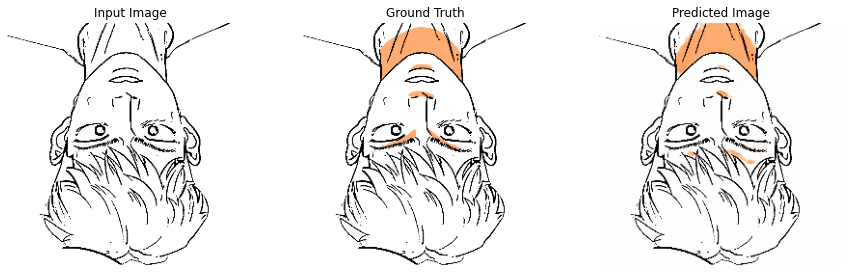

Epoch:  20
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 21 is 180.7512845993042 sec



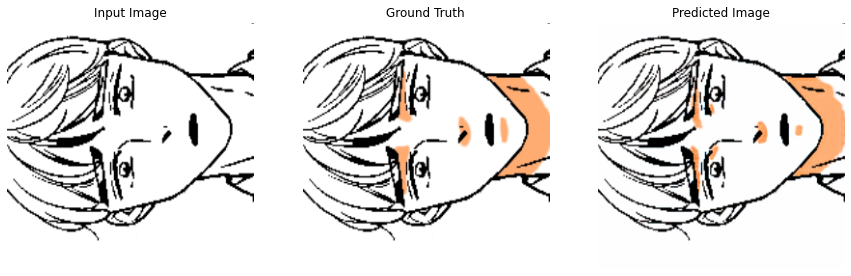

Epoch:  21
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 22 is 179.31361198425293 sec



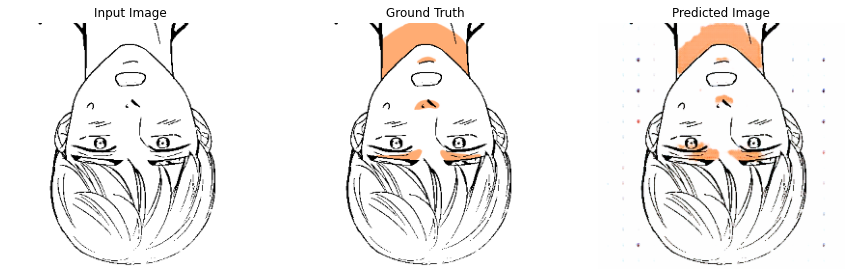

Epoch:  22
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 23 is 179.90223097801208 sec



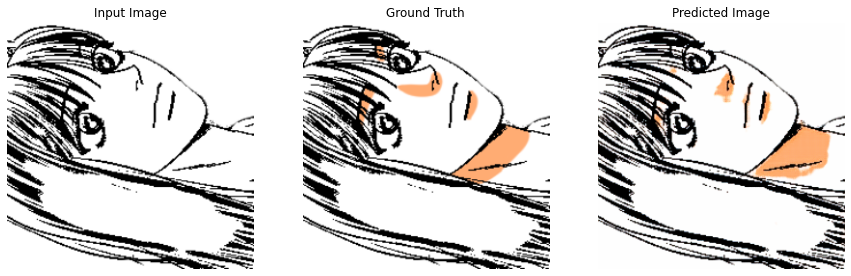

Epoch:  23
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 24 is 180.76072335243225 sec



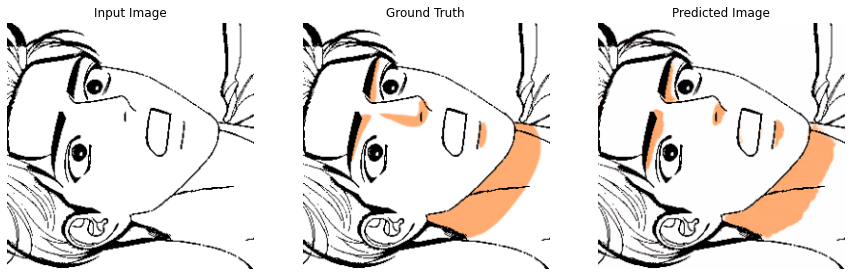

Epoch:  24
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 25 is 181.6395227909088 sec



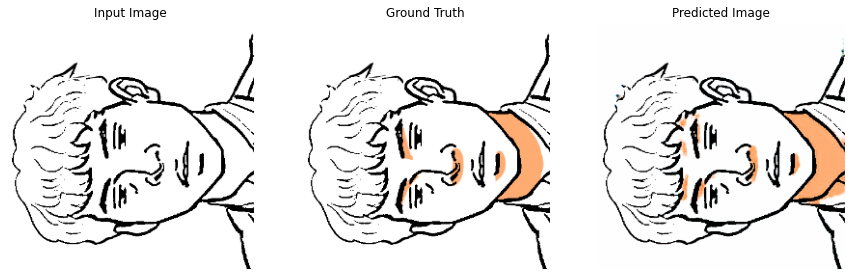

Epoch:  25
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 26 is 180.39470076560974 sec



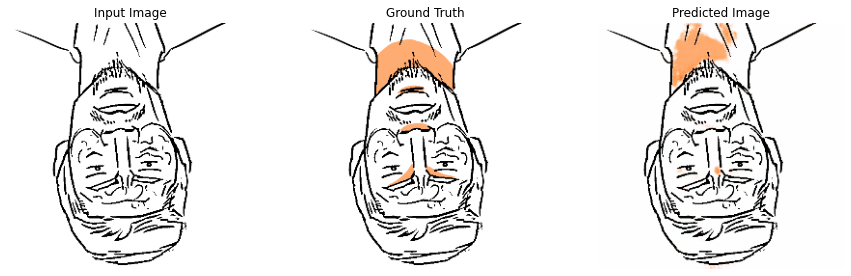

Epoch:  26
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 27 is 183.3822784423828 sec



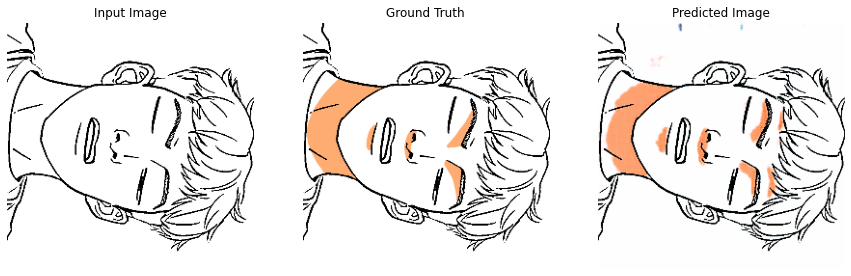

Epoch:  27
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 28 is 178.94873547554016 sec



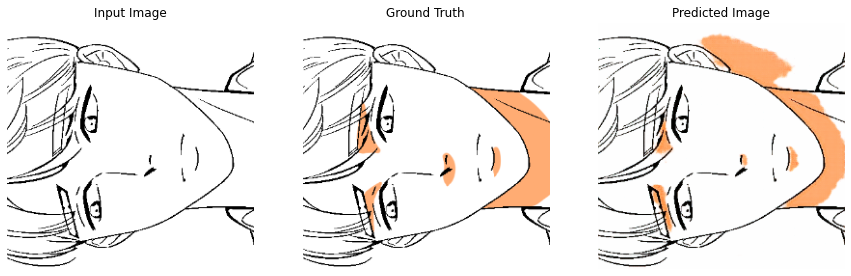

Epoch:  28
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 29 is 180.10305333137512 sec



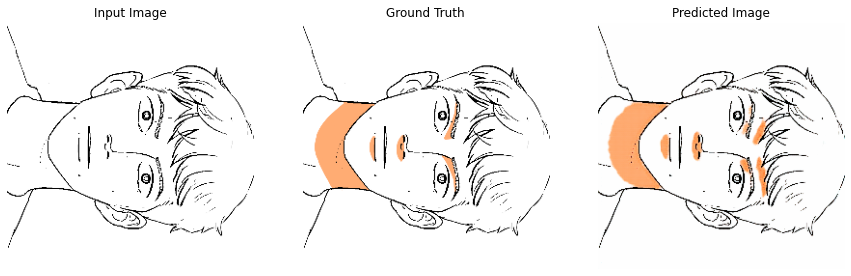

Epoch:  29
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 30 is 181.86659979820251 sec



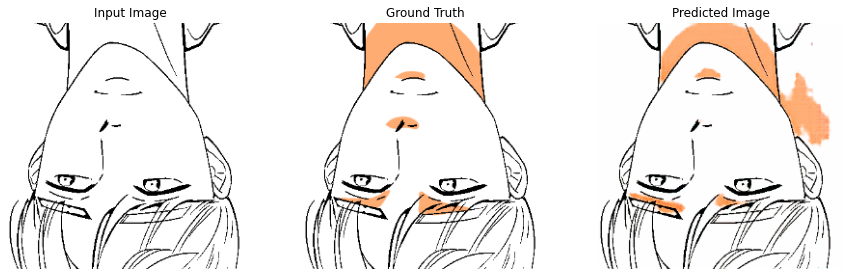

Epoch:  30
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 31 is 181.37020611763 sec



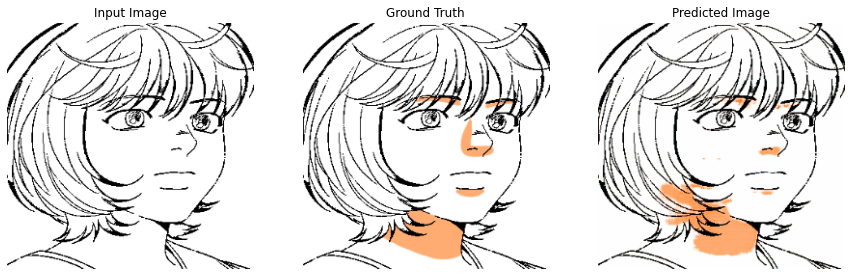

Epoch:  31
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 32 is 180.17557835578918 sec



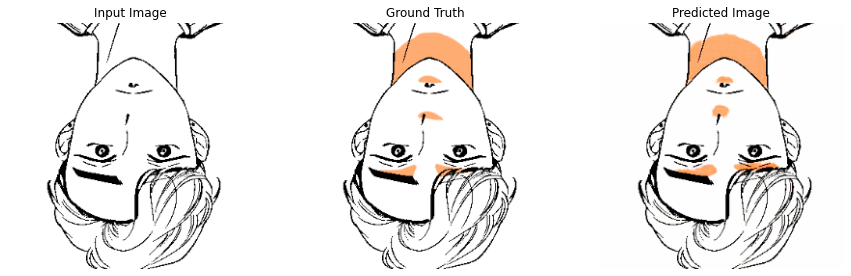

Epoch:  32
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 33 is 179.39322233200073 sec



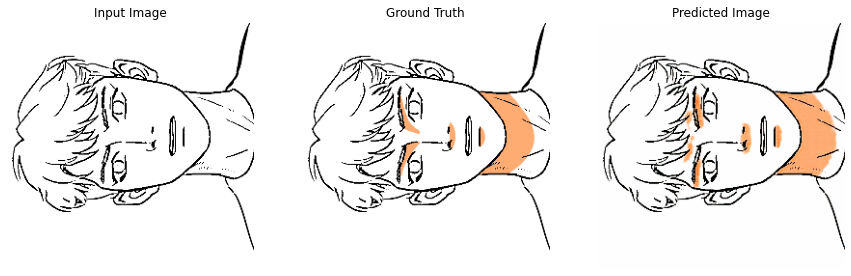

Epoch:  33
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 34 is 180.28306555747986 sec



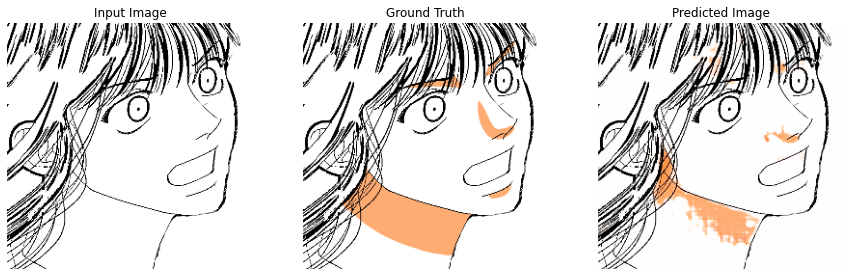

Epoch:  34
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 35 is 181.92560696601868 sec



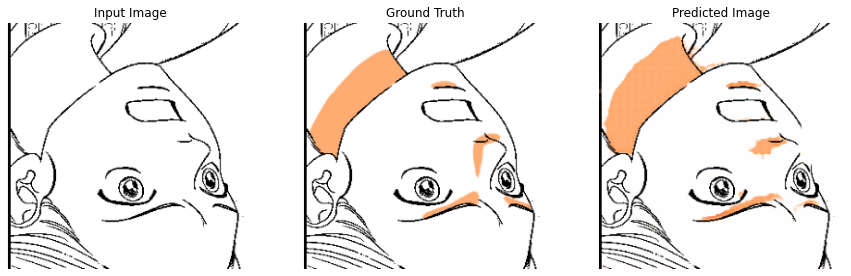

Epoch:  35
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 36 is 179.7056758403778 sec



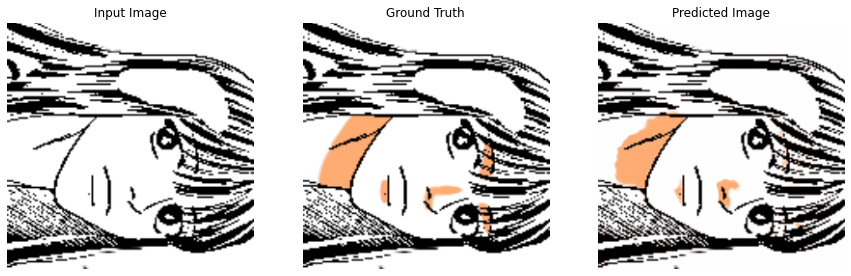

Epoch:  36
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 37 is 179.83685064315796 sec



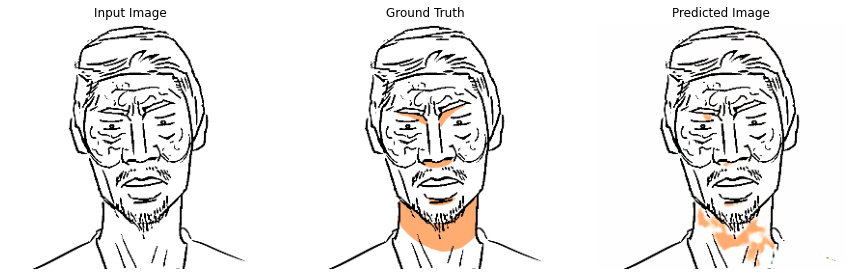

Epoch:  37
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 38 is 178.1205494403839 sec



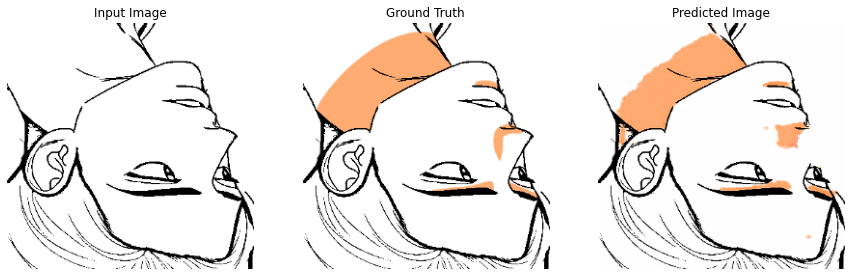

Epoch:  38
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 39 is 178.82083177566528 sec



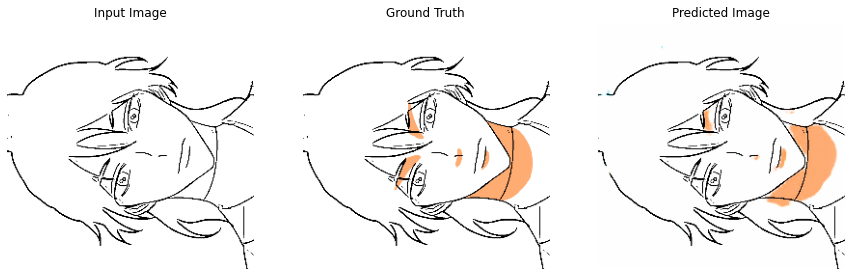

Epoch:  39
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 40 is 183.05134510993958 sec



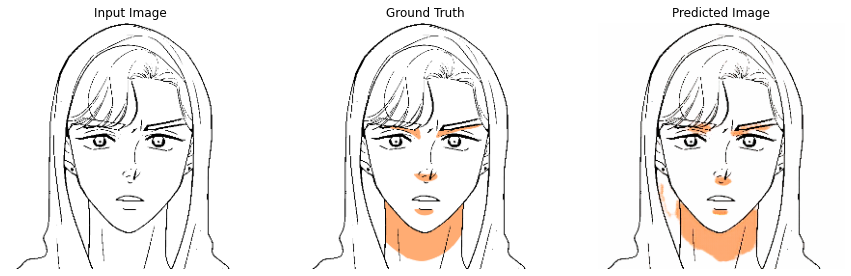

Epoch:  40
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 41 is 179.52754282951355 sec



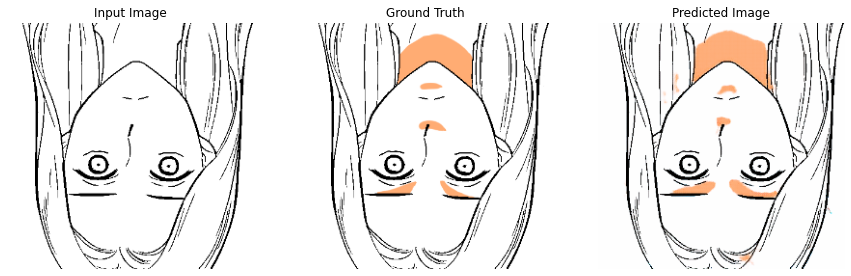

Epoch:  41
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 42 is 179.81373167037964 sec



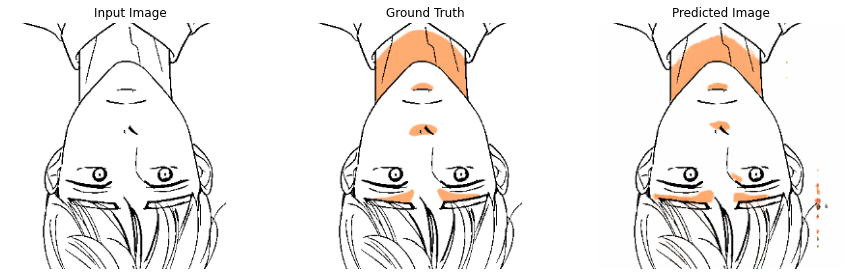

Epoch:  42
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 43 is 178.46369886398315 sec



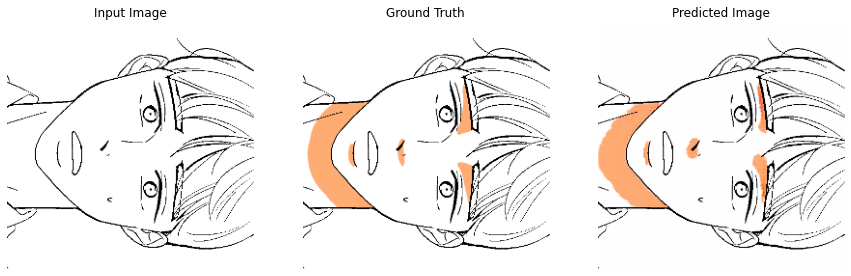

Epoch:  43
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 44 is 177.8477063179016 sec



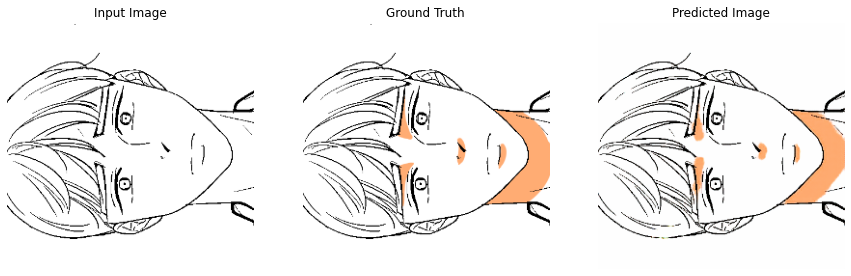

Epoch:  44
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 45 is 181.39552879333496 sec



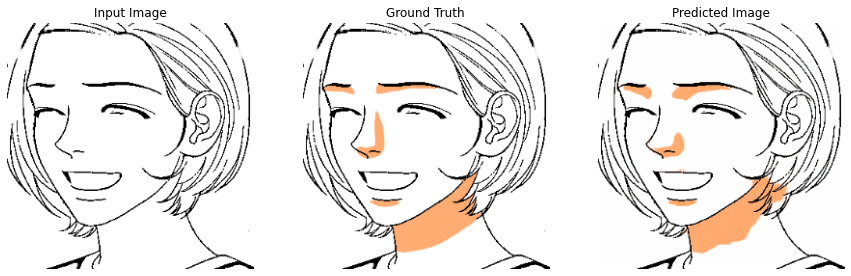

Epoch:  45
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 46 is 181.59659886360168 sec



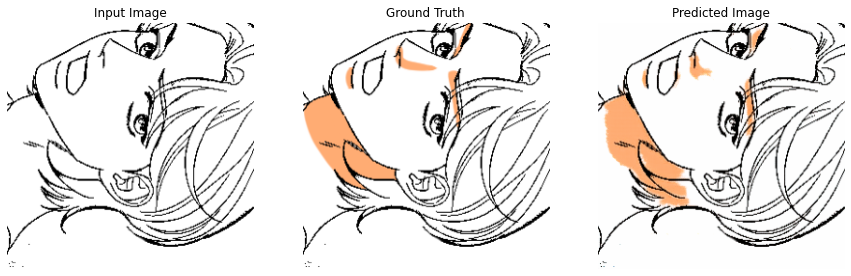

Epoch:  46
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 47 is 180.07792448997498 sec



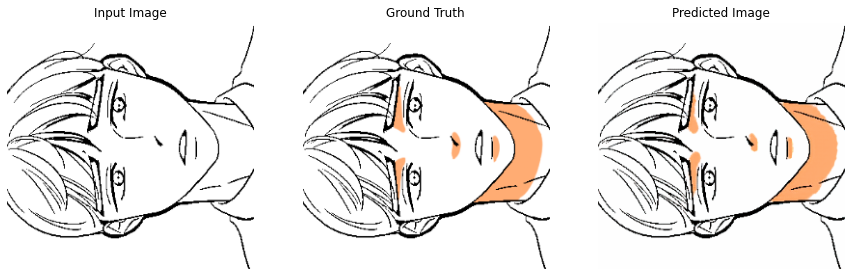

Epoch:  47
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 48 is 177.57111763954163 sec



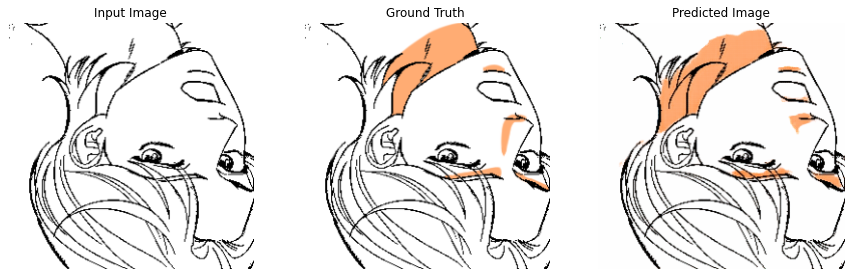

Epoch:  48
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 49 is 178.611252784729 sec



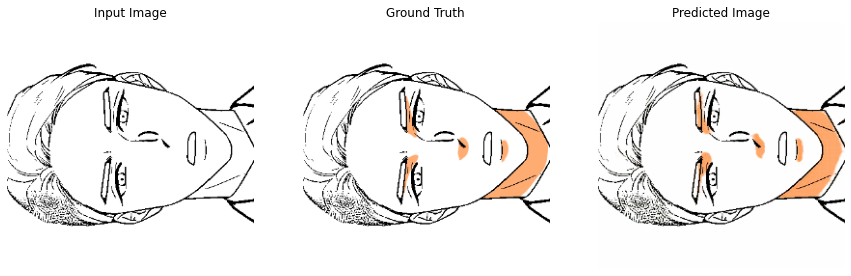

Epoch:  49
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 50 is 180.92925667762756 sec



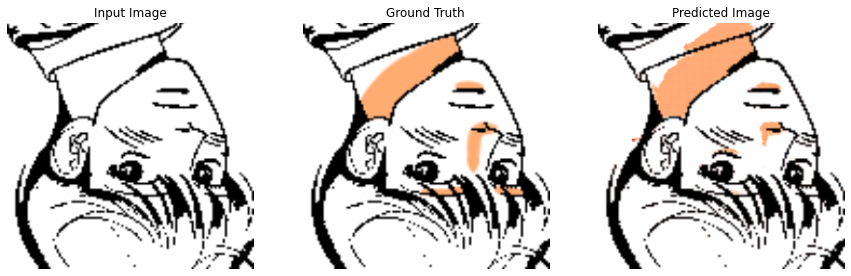

Epoch:  50
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 51 is 180.96304273605347 sec



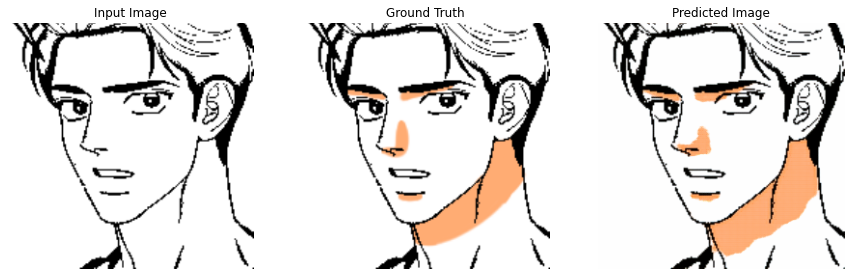

Epoch:  51
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 52 is 179.87211155891418 sec



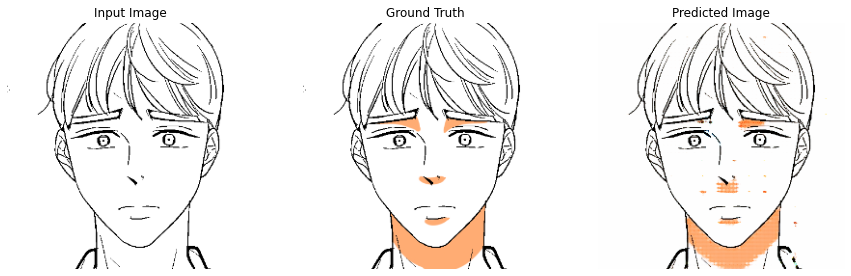

Epoch:  52
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 53 is 178.70346236228943 sec



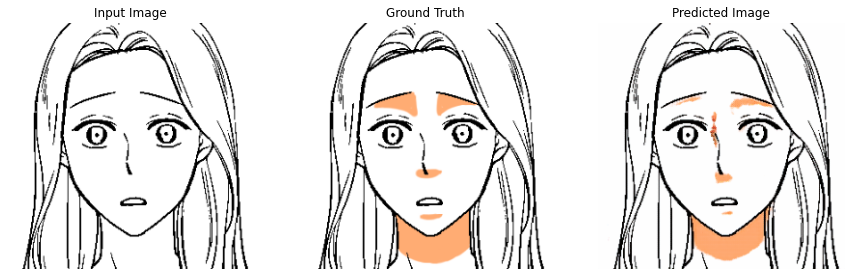

Epoch:  53
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 54 is 179.80814480781555 sec



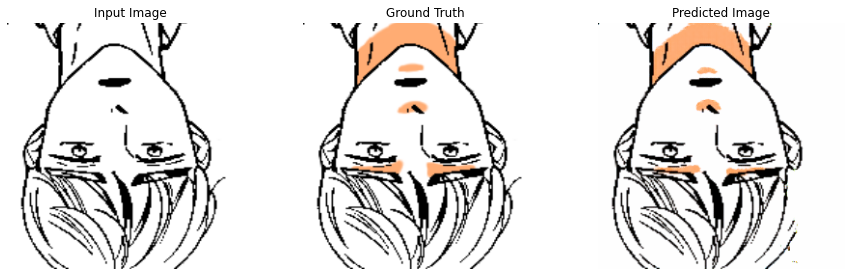

Epoch:  54
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 55 is 182.7951738834381 sec



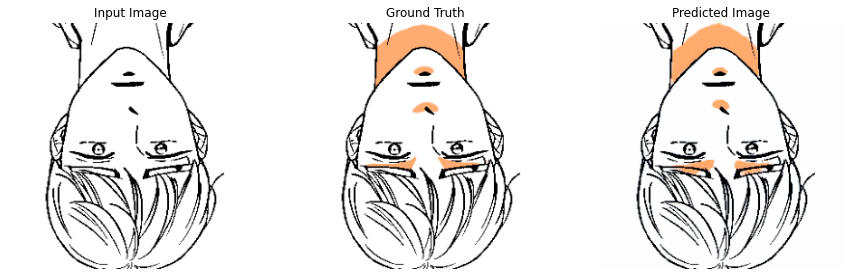

Epoch:  55
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 56 is 182.28383898735046 sec



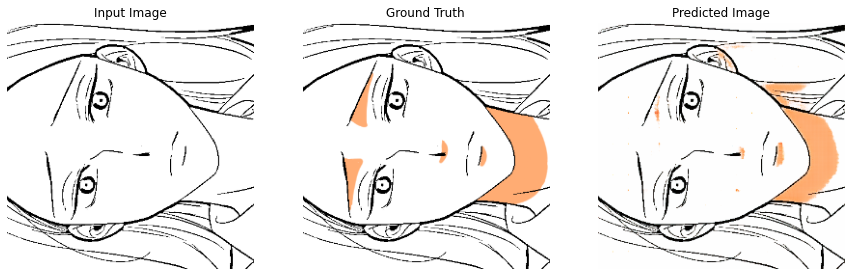

Epoch:  56
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 57 is 180.97404670715332 sec



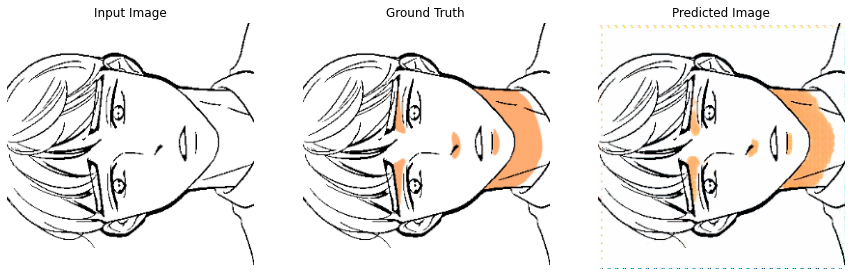

Epoch:  57
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 58 is 178.33550310134888 sec



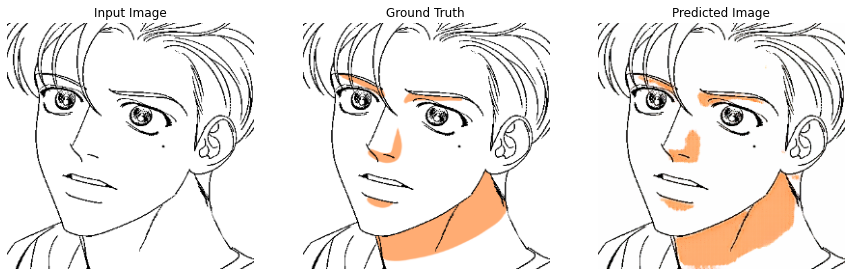

Epoch:  58
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 59 is 178.7694172859192 sec



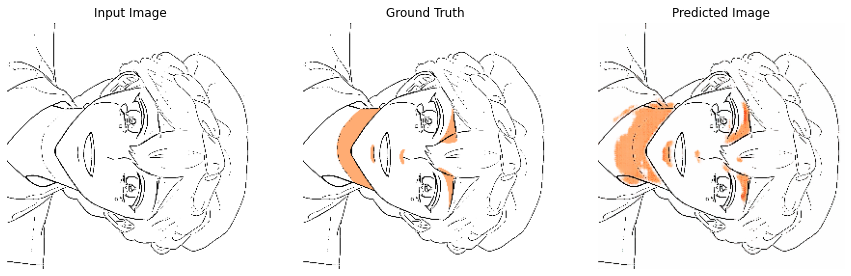

Epoch:  59
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 60 is 182.21070075035095 sec



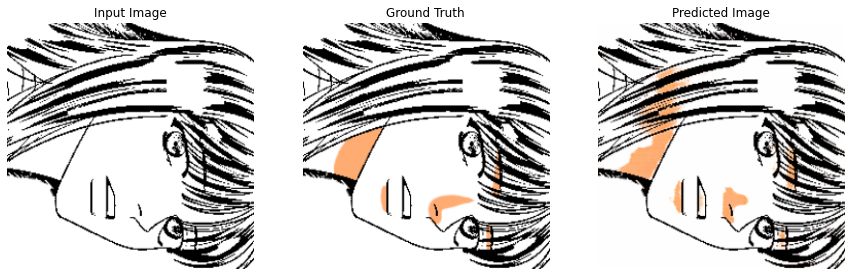

Epoch:  60
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 61 is 181.89472723007202 sec



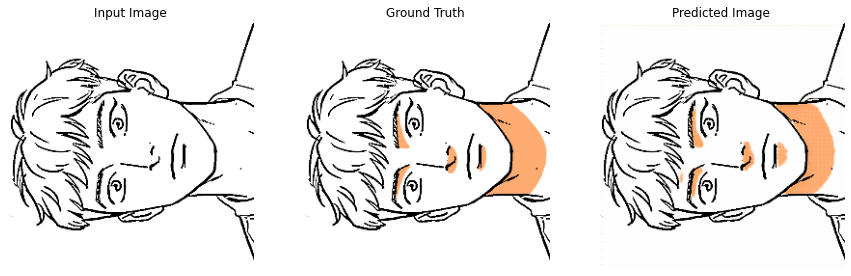

Epoch:  61
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 62 is 180.11358428001404 sec



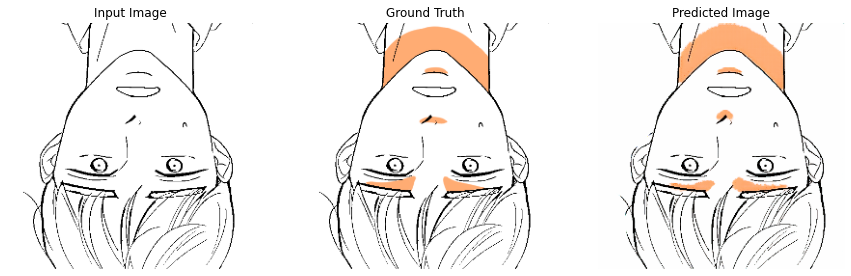

Epoch:  62
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 63 is 179.42967534065247 sec



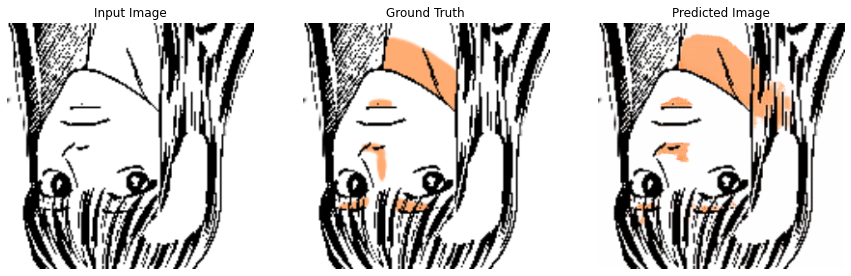

Epoch:  63
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 64 is 178.88326334953308 sec



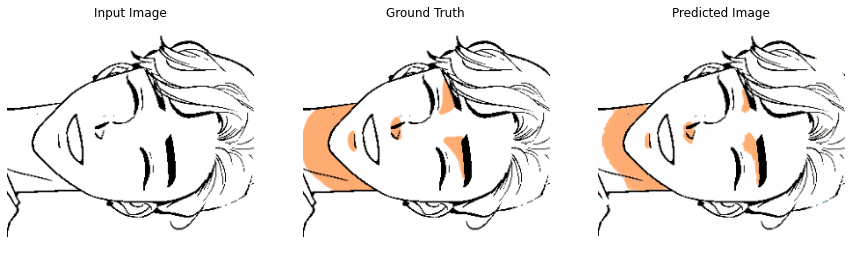

Epoch:  64
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 65 is 182.2208833694458 sec



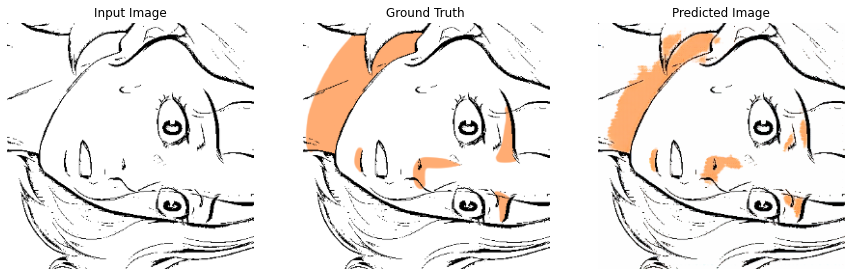

Epoch:  65
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 66 is 182.64370608329773 sec



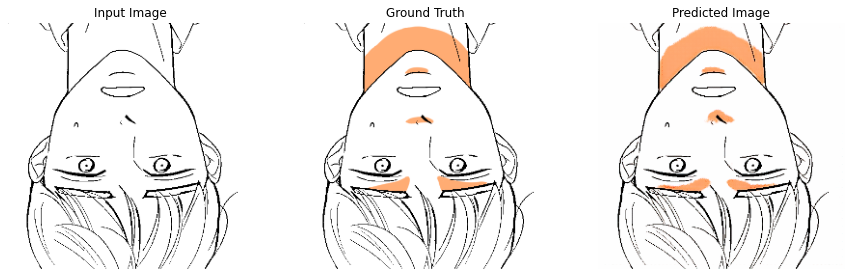

Epoch:  66
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 67 is 180.5578966140747 sec



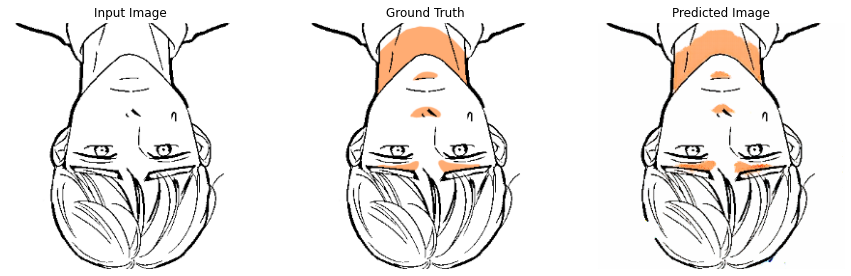

Epoch:  67
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 68 is 180.61743140220642 sec



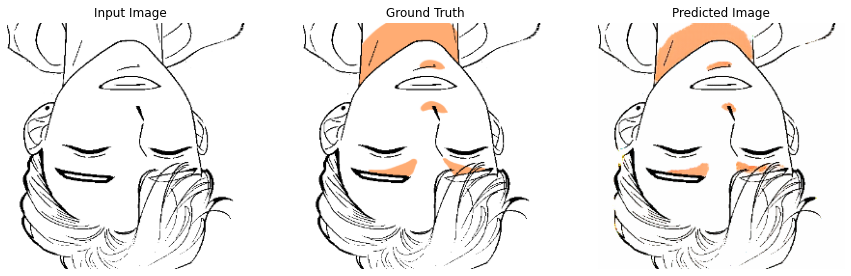

Epoch:  68
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 69 is 179.66510581970215 sec



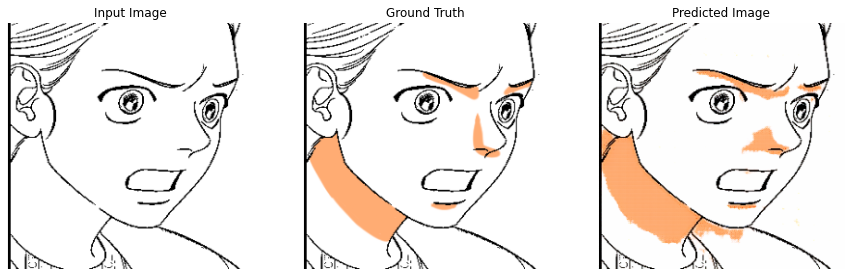

Epoch:  69
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 70 is 182.94416904449463 sec



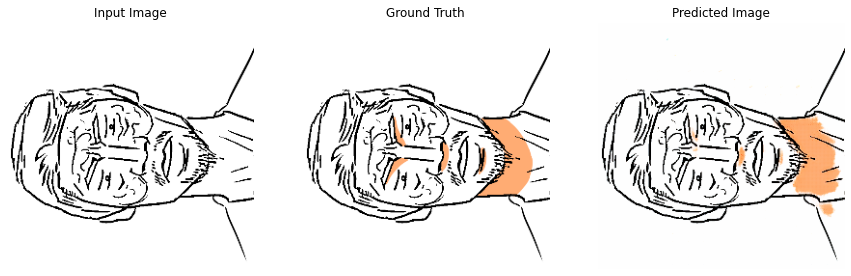

Epoch:  70
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 71 is 181.87558913230896 sec



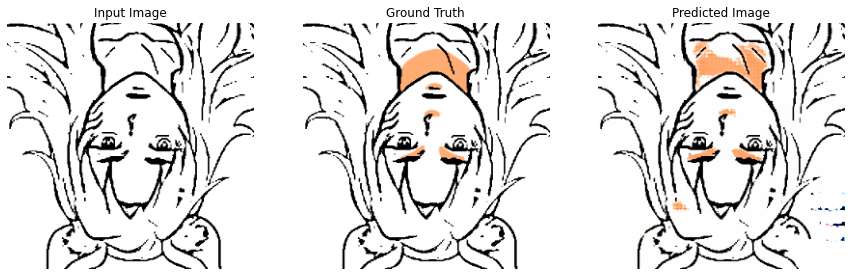

Epoch:  71
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 72 is 180.6515817642212 sec



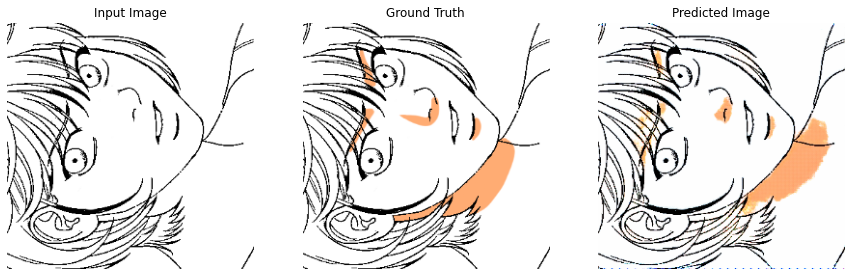

Epoch:  72
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 73 is 180.63382649421692 sec



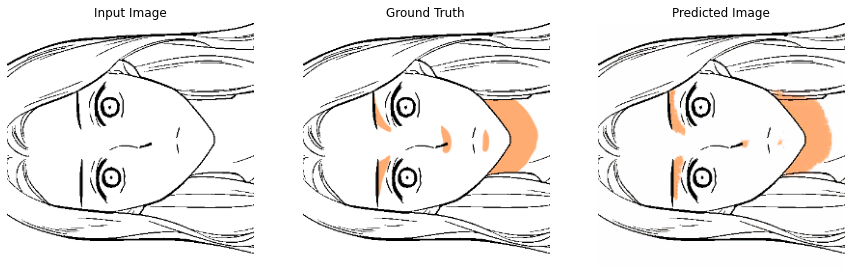

Epoch:  73
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 74 is 179.76075267791748 sec



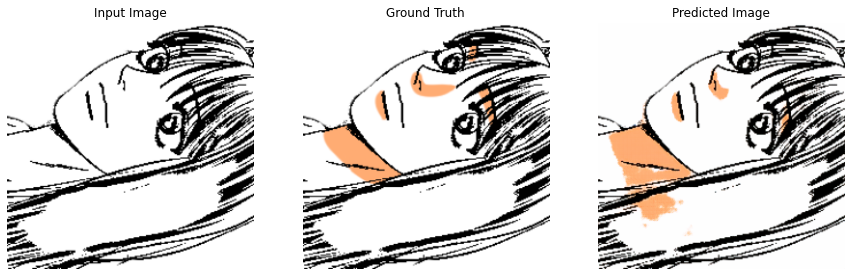

Epoch:  74
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 75 is 182.63615083694458 sec



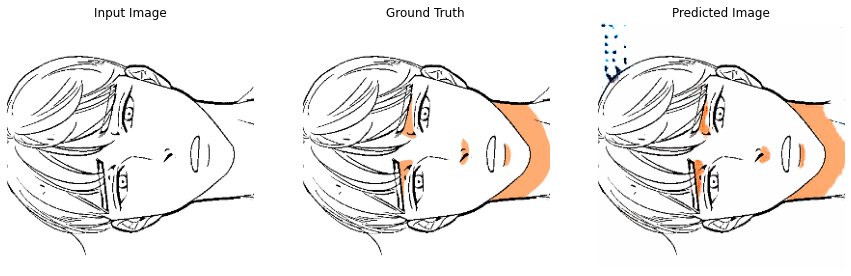

Epoch:  75
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 76 is 184.37329816818237 sec



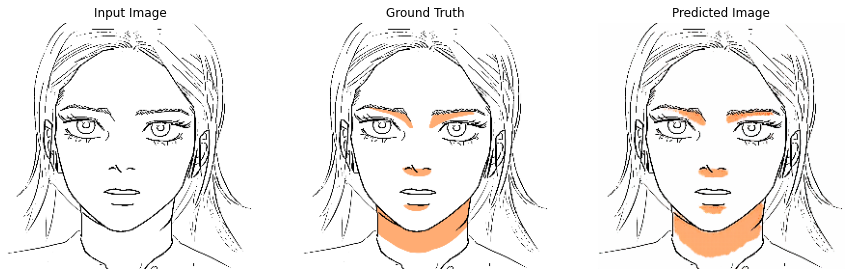

Epoch:  76
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 77 is 180.51241183280945 sec



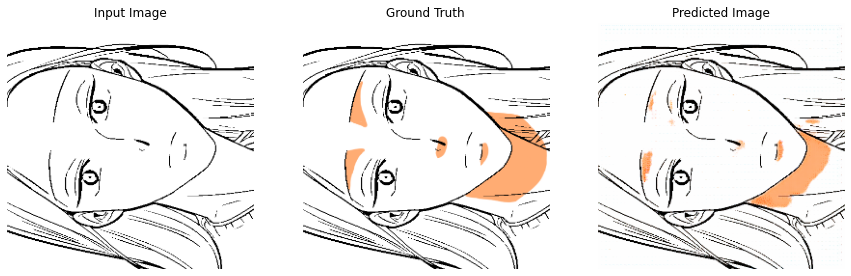

Epoch:  77
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 78 is 181.6648712158203 sec



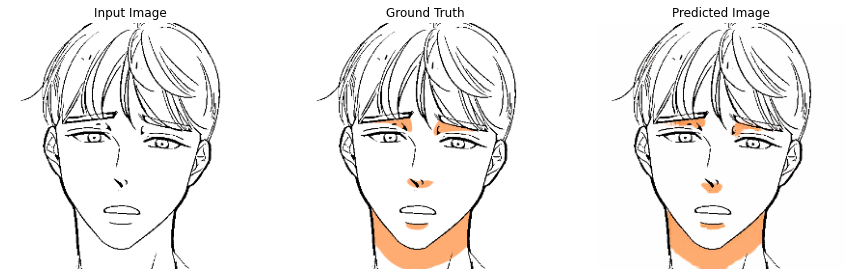

Epoch:  78
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 79 is 181.26829600334167 sec



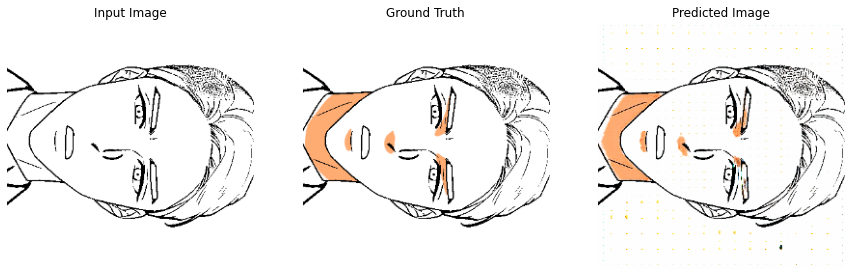

Epoch:  79
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 80 is 184.28389263153076 sec



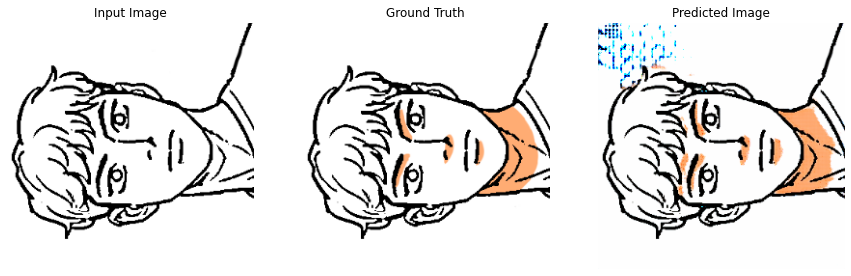

Epoch:  80
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 81 is 182.88459634780884 sec



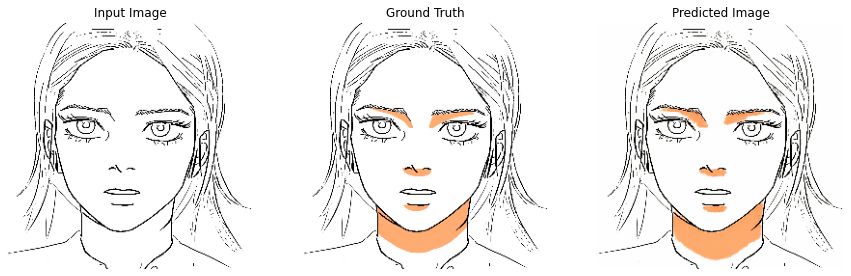

Epoch:  81
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 82 is 180.28258514404297 sec



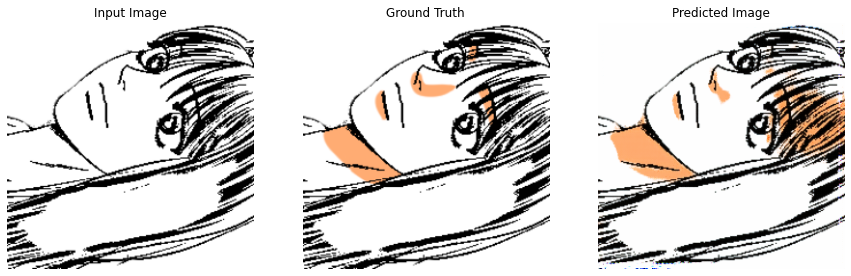

Epoch:  82
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 83 is 179.51055788993835 sec



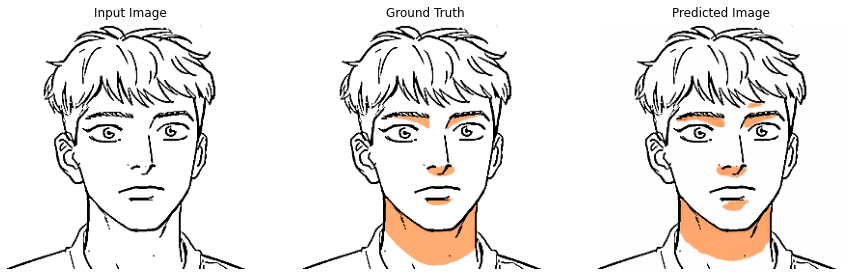

Epoch:  83
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 84 is 180.83555674552917 sec



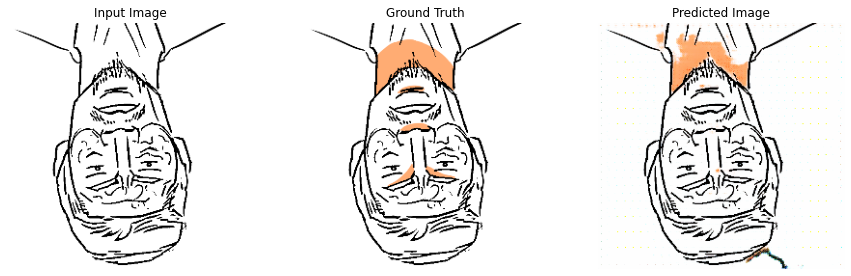

Epoch:  84
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 85 is 183.83511900901794 sec



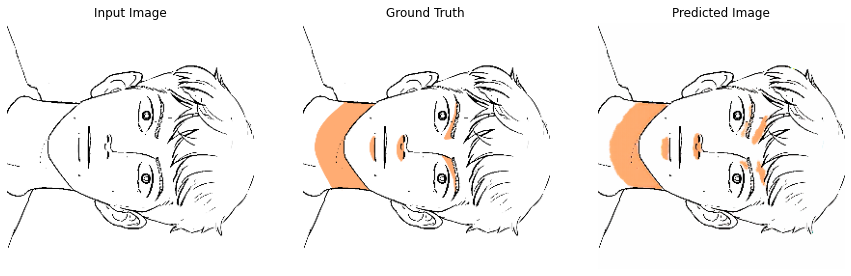

Epoch:  85
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 86 is 183.26267766952515 sec



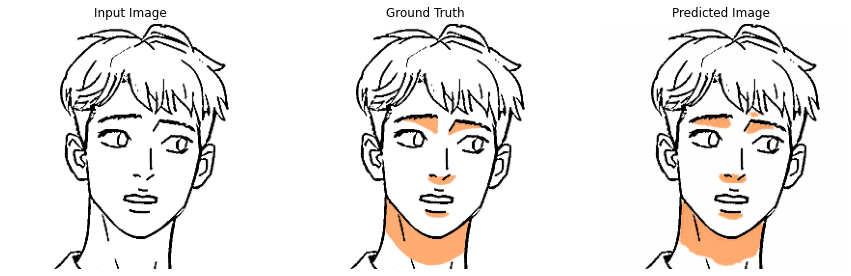

Epoch:  86
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 87 is 181.40763521194458 sec



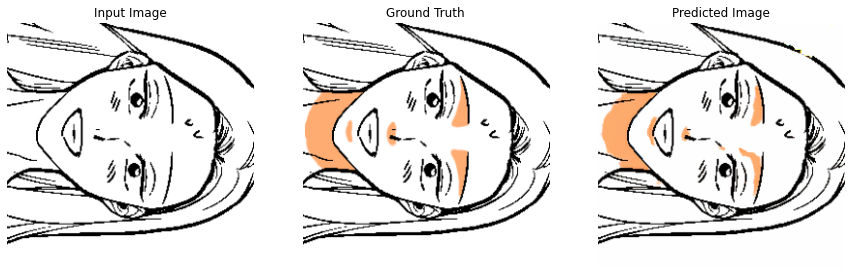

Epoch:  87
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 88 is 179.94682455062866 sec



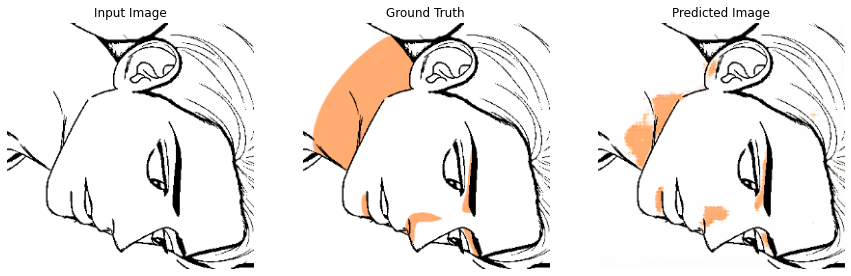

Epoch:  88
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 89 is 180.99508452415466 sec



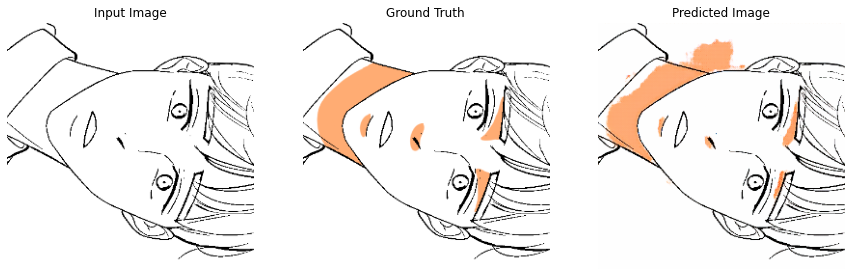

Epoch:  89
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 90 is 183.8602979183197 sec



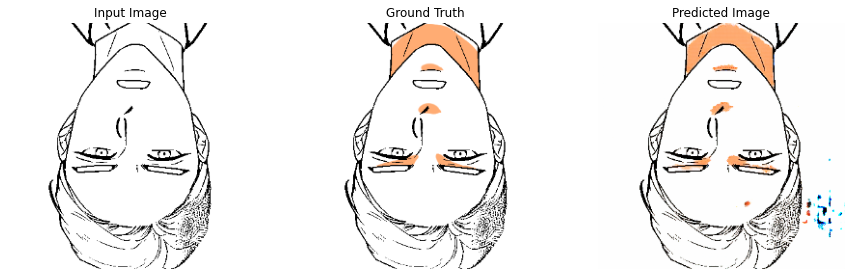

Epoch:  90
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 91 is 182.09535217285156 sec



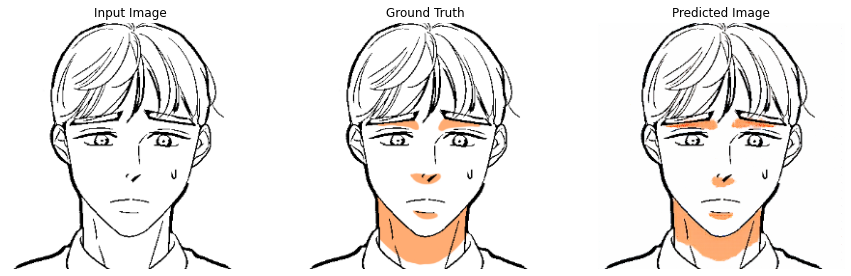

Epoch:  91
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 92 is 182.5039529800415 sec



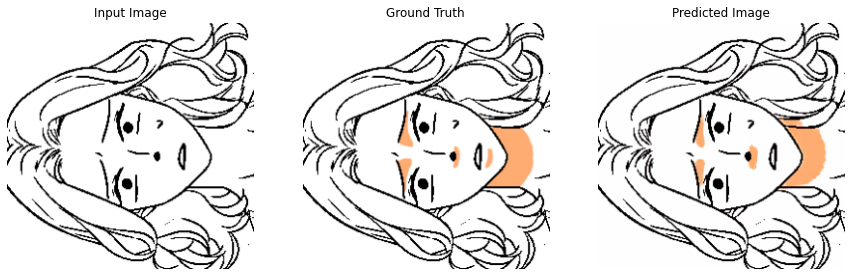

Epoch:  92
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 93 is 182.23171973228455 sec



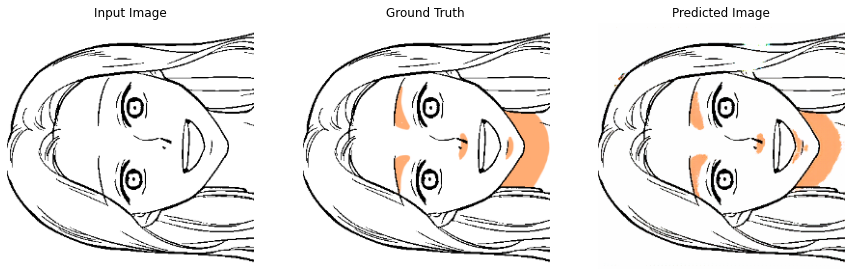

Epoch:  93
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 94 is 180.93918085098267 sec



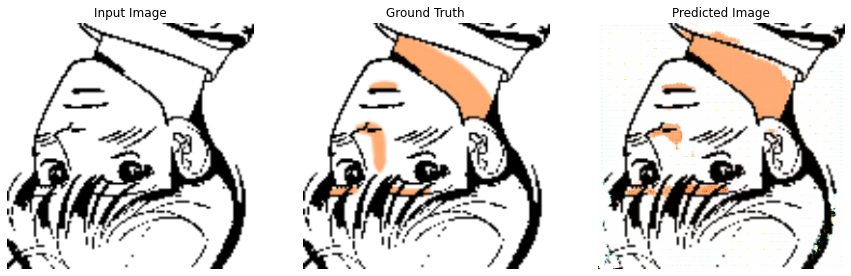

Epoch:  94
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................
Time taken for epoch 95 is 185.71546363830566 sec



In [ ]:
fit(train_dataset, EPOCHS, test_dataset)

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

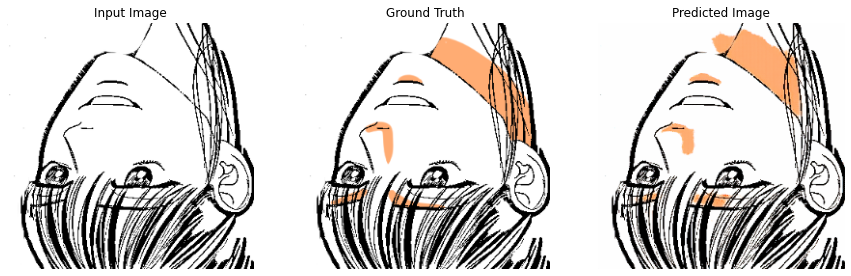

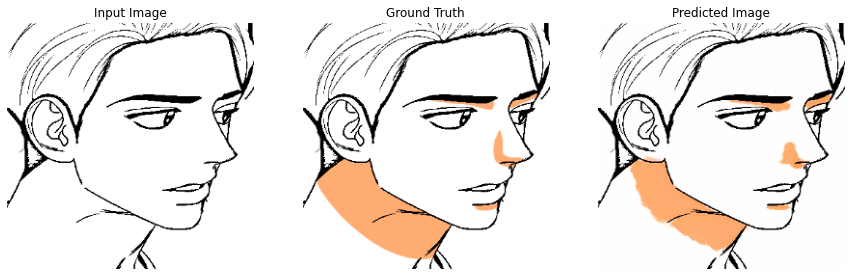

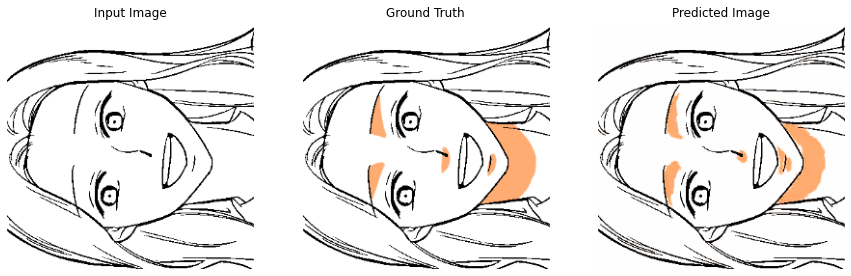

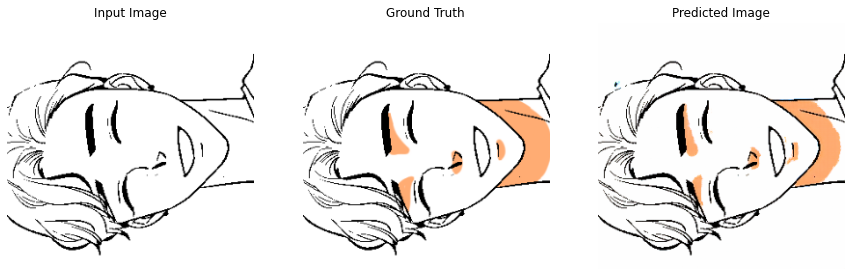

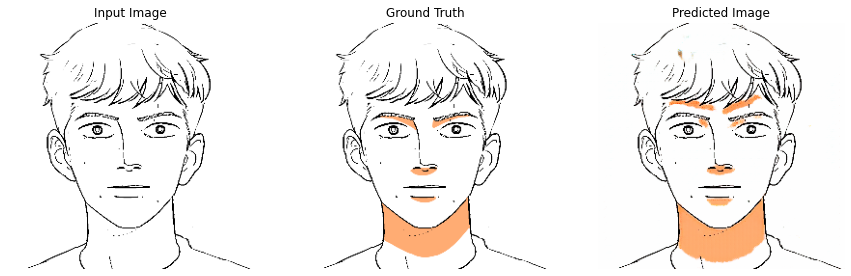

In [ ]:
for example_input, example_target in test_dataset.take(5):
    generate_images(generator, example_input, example_target)

In [ ]:
generator.save('AnimeColorizationModelv7.h5')

In [ ]:
from google.colab import files
files.download('AnimeColorizationModelv7.h5')  # from colab to browser download

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# 가중치와 옵티마이저를 포함하여 정확히 동일한 모델을 다시 생성합니다
new_model = tf.keras.models.load_model('AnimeColorizationModelv7.h5')

# 모델 구조를 출력합니다
new_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
sequential_18 (Sequential)      (None, 128, 128, 64) 3072        input_2[0][0]                    
__________________________________________________________________________________________________
sequential_19 (Sequential)      (None, 64, 64, 128)  131584      sequential_18[0][0]              
__________________________________________________________________________________________________
sequential_20 (Sequential)      (None, 32, 32, 256)  525312      sequential_19[0][0]              
____________________________________________________________________________________________